# Datashader
Datashader is a library that extends Bokeh and it is useul for plotting large quantity of data points. Using Datashader is highly recommended when dealing with more than a million data points, especially when other plotting libraries have trouble visualising the data. Datashader uses aggregation to visualise data, which means we are not seeing every single data point rather an aggregated form of the data. The output of datashader is an image, which can be used by other libraries. Holoviews is one of the packages which is based on bokeh and take advantage of Datashader for ploting large datasets.<br>
Datashader only supports a few types of plots:
- Scatter plots and heatmaps
- Trajectories
- Rasters

In [1]:
import datashader as ds

In [5]:
import pandas as pd
import numpy as np

np.random.seed(14)
n = 500000
df1 = pd.DataFrame(
    {
        "x": np.random.normal(0, 2, n),
        "y": np.random.normal(0, 2, n),
        "z": np.random.normal(1, 0.1, n),
        "cat": "A",
    }
)
df2 = pd.DataFrame(
    {
        "x": np.random.normal(3, 1, n),
        "y": np.random.normal(0, 1, n),
        "z": np.random.normal(5, 0.2, n),
        "cat": "B",
    }
)
df3 = pd.DataFrame(
    {
        "x": np.random.normal(-3, 1, n),
        "y": np.random.normal(2, 1, n),
        "z": np.random.normal(10, 0.5, n),
        "cat": "C",
    }
)

df = pd.concat([df1, df2, df3], ignore_index=True)
df["cat"] = df["cat"].astype("category")
df.head()

,x,y,z,cat
0,3.102678,1.147657,0.977741,A
1,0.158372,-0.146898,1.073777,A
2,0.347953,0.099332,0.983389,A
3,-0.144673,-0.518606,0.802015,A
4,-4.008659,-0.337430,1.174948,A


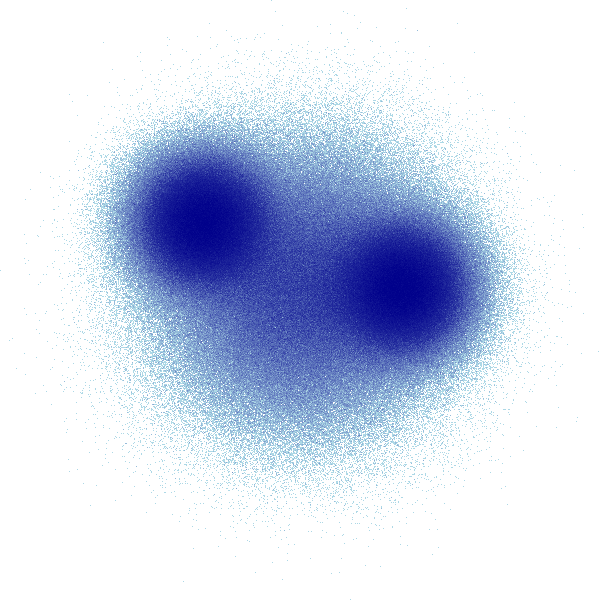

In [7]:
import datashader as ds
import datashader.transfer_functions as tf

tf.shade(ds.Canvas().points(df, "x", "y"))

## Datashader pipeline
Datashader follows these steps to generate an image from data:
1. Projection
2. Aggregation
3. Transformation
4. Colormapping
5. Embedding

Let's see how each step is done.

### Projection and Aggregation
Here, projection means choosing the features in the data we want to visualise. In a scatter plot we are going to have an x-axis and a y-axis, so we want to decide which column is going to be _x_ and which column is going to be _y_. Since datashader visualises an aggregated form of the data in an image, we also need to decide what aggregation function should be used. Datashader supports the following functions:
- `any()`: returns __*1*__ if any data point exists in the pixel, otherwise returns __*0*__.
- `count()`: returns the number of data points in each pixel.
- `count_cat()`: returns the number of data points for each category in each pixel.
- `sum()`: the total value of all the numbers in a pixel (we can also specify which column should be used).



First, we need to create an empty canvas.

In [8]:
canvas = ds.Canvas(plot_width=400, plot_height=400, x_range=(-5, 5), y_range=(-5, 5))

Then we pass in the data, the columns we want to use , and the aggregation function.

In [9]:
aggr = canvas.points(df, "x", "y", agg=ds.count())
aggr

<xarray.DataArray (y: 400, x: 400)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint32)
Coordinates:
  * x        (x) float64 -4.987 -4.963 -4.938 -4.912 ... 4.912 4.938 4.963 4.987
  * y        (y) float64 -4.987 -4.963 -4.938 -4.912 ... 4.912 4.938 4.963 4.987

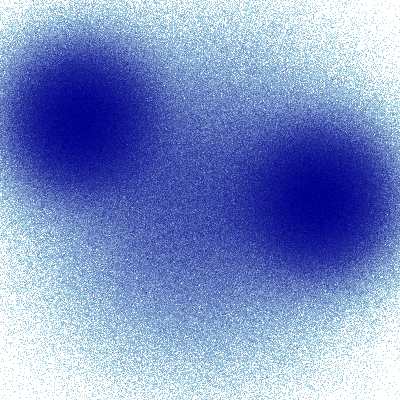

In [10]:
tf.shade(aggr)

### Transformation
In this step we apply any form of mathematical function if necessary. For instance, we may want to have only the top 10% values in the plot, or apply a `log` function to data.

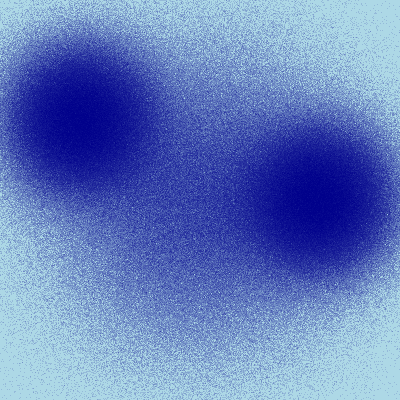

In [11]:
tf.shade(np.log(aggr + 1))

### Colormapping
Here we can select the colormap of the visualisation using Bokeh palettes.

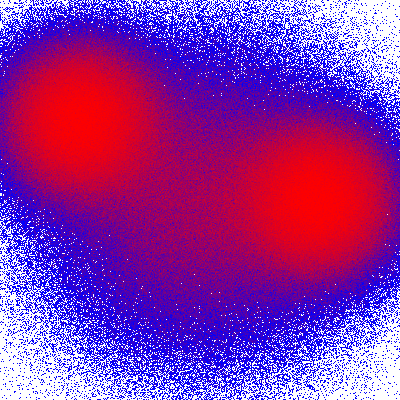

In [12]:
tf.shade(aggr, cmap=["blue", "red"])

When we are dealing with categorical variables we can assign a color to each category.

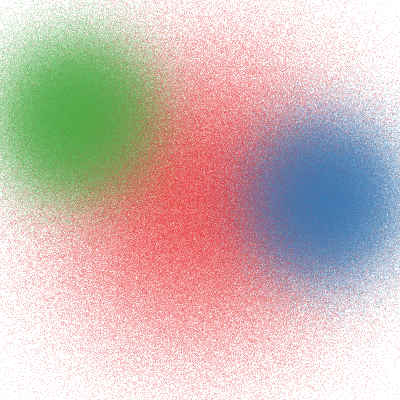

In [13]:
colors = {"A": "red", "B": "blue", "C": "green"}
aggr = canvas.points(df, "x", "y", agg=ds.count_cat("cat"))
tf.shade(aggr, colors)

We can make the points appear larger by spreading them.

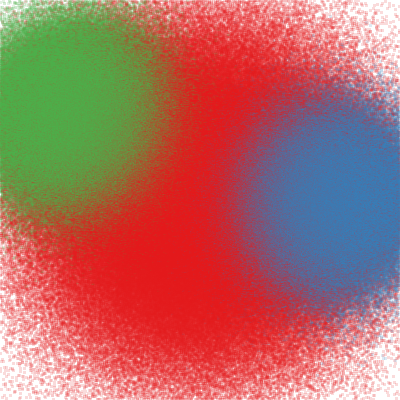

In [14]:
tf.spread(tf.shade(aggr, colors))

### Embedding
The image generated by datashader can be used like a normal image, or can be visualised via Holoviews. Using holoviews allows us to quickly render the image when we zoom in and out.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
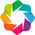

In [15]:
import holoviews as hv
from holoviews.operation.datashader import datashade, dynspread

hv.extension("bokeh")

colors = {"A": "red", "B": "blue", "C": "green"}
pts = hv.Points(df, ["x", "y"])
plot = datashade(pts, color_key=colors, aggregator=ds.count_cat("cat"))

Note the differences between the code above and when we used purely datashader. 

In [16]:
plot

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

Spreading makes it easier to see when we zoom in.

In [17]:
dynspread(plot)

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

# HoloViews
As you might have noticed plotting with bokeh may require multiple steps, and can be time consuming. HoloViews tries to simpify plotting with bokeh and adds extra functionalities which makes visualising and exploring the data much easier. Also, as we mentioned, it uses Datashader which makes it a great option for plotting large amount of data.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
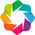

In [18]:
import numpy as np
import pandas as pd
import holoviews as hv
from bokeh import palettes

hv.extension("bokeh")

## Creating elements

All basic elements accept their data as a single, mandatory positional argument which may be supplied in a number of different formats, some of which we will now examine. A handful of *annotation* elements are exceptions to this rule, namely ``Arrow``, ``Text``, ``Bounds``, ``Box`` and ``Ellipse``, as they require additional positional arguments.

### A simple curve

To start with a simple example, we will sample a quadratic function $y=100-x^2$ at 21 different values of $x$ and wrap that data in a HoloViews element:

In [19]:
xs = [i for i in range(-10, 11)]
ys = [100 - (x ** 2) for x in xs]
simple_curve = hv.Curve((xs, ys))
simple_curve

:Curve   [x]   (y)

Here we supplied two lists of values as a tuple to [``hv.Curve``]((http://build.holoviews.org/reference/elements/bokeh/Curve.html), assigned the result to the attribute ``simple_curve``, and let Jupyter display the object using its default visual representation.  As you can see, that default visual representation is a Bokeh plot, which is automatically generated by HoloViews when Jupyter requests it. But ``simple_curve`` itself is just a wrapper around your data, not a plot, and you can choose other representations that are not plots.  For instance, printing the object will give you a purely textual representation instead:

In [20]:
print(simple_curve)

:Curve   [x]   (y)


The textual representation indicates that this object is a continuous mapping from `x` to `y`, which is how HoloViews knew to render it as a continuous curve. There are a number of similar elements to [``Curve``](http://build.holoviews.org/reference/elements/bokeh/Curve.html) such as [``Area``](http://build.holoviews.org/reference/elements/bokeh/Area.html) and [``Scatter``](http://build.holoviews.org/reference/elements/bokeh/Scatter.html), which you can try out for yourself in the exercises.

### Annotating the curve

Wrapping your data (``xs`` and ``ys``) here as a HoloViews element is sufficient to make it visualisable, but there are many other aspects of the data that we can capture to convey more about its meaning to HoloViews. For instance, we might want to specify what the x-axis and y-axis actually correspond to, in the real world. Perhaps this parabola is the trajectory of a ball thrown into the air, in which case we could declare the object as:

In [21]:
trajectory = hv.Curve((xs, ys), kdims=["distance"], vdims=["height"])
trajectory

:Curve   [distance]   (height)

Here we have added *semantic* information about our data to the [``Curve``](http://build.holoviews.org/reference/elements/bokeh/Curve.html) element.  Specifically, we told HoloViews that the ``kdim`` or *key dimension* of our data corresponds to the real-world independent variable ('distance'), and the ``vdim`` or *value dimension* 'height' is the real-world dependent variable. Even though the additional information we provided is about the *data*, not directly about the plot, HoloViews is designed to reveal the properties of your data accurately, and so the axes now update to show what these dimensions represent.

### Casting between elements

The type of an element is a declaration of important facts about your data, which gives HoloViews the appropriate hint required to generate a suitable visual representation from it. For instance, calling it a ``Curve`` is a declaration from the user that the data consists of samples from an underlying continuous function, which is why HoloViews plots it as a connected object. If we convert to an ``hv.Scatter`` object instead, the same set of data will show up as separated points, because "Scatter" does not make an assumption that the data is meant to be continuous:

In [22]:
hv.Scatter(simple_curve)

:Scatter   [x]   (y)

Casting the same data between different Element types in this way is often useful as a way to see your data differently, particularly if you are not certain of a single best way to interpret the data.  Casting preserves your declared metadata as much as possible, propagating your declarations from the original object to the new one.

### Turning arrays into elements

The curve above was constructed from a list of x-values and a list of y-values. Next we will create an element using an entirely different datatype, namely a [NumPy](http://www.numpy.org/) array:

In [23]:
x = np.linspace(0, 10, 500)
y = np.linspace(0, 10, 500)
xx, yy = np.meshgrid(x, y)

arr = np.sin(xx) * np.cos(yy)
image = hv.Image(arr)

As above, we know that this data was sampled from a continuous function, but this time the data is mapping from *two* key dimensions, so we declare it as an [``hv.Image``]((http://build.holoviews.org/reference/elements/bokeh/Image.html) object.  As you might expect, an ``Image`` object is visualized as an image by default:

In [24]:
image

:Image   [x,y]   (z)

### Selecting Columns
Holoviews can also work with pandas data frames, which means we can pass in the name of the columns we want to see.

In [25]:
ngdf = pd.read_excel(
    "../../data/processed/NaturalGas/NG_PROD_SUM.xls",
    sheet_name=2,
    header=2,
    index_col="Date",
    parse_dates=True,
)
ngdf.columns = [c[: c.find(" ", 5)] for c in ngdf.columns]
ngdf = ngdf.resample("A").sum()
ngdf.index = ngdf.index.year
ngdf.head()

,Other,Alabama,Arizona,Florida,Idaho,Illinois,Indiana,Kentucky,Maryland,Michigan,Mississippi,Missouri,Nebraska,Nevada,New York,Oregon,South,Tennessee,Virginia
Date,,,,,,,,,,,,,,,,,,,
1991,797930,223875.0,0.0,3703.0,0.0,466.0,232.0,78905.0,29.0,201413.0,180771.0,15.0,782.0,53.0,22778.0,0.0,5804.0,1856.0,14906.0
1992,818233,413616.0,0.0,7584.0,0.0,348.0,173.0,79690.0,31.0,200479.0,165537.0,27.0,1177.0,30.0,23522.0,0.0,6963.0,1770.0,24733.0
1993,807040,446320.0,0.0,8011.0,0.0,338.0,191.0,86965.0,28.0,210298.0,145025.0,14.0,2115.0,23.0,21198.0,0.0,7058.0,1659.0,37839.0
1994,793263,578862.0,0.0,8469.0,0.0,333.0,106.0,73082.0,27.0,228321.0,121802.0,8.0,2899.0,12.0,20475.0,0.0,7264.0,1991.0,50262.0
1995,774977,580125.0,0.0,7132.0,0.0,334.0,249.0,74756.0,24.0,243865.0,119454.0,17.0,2239.0,12.0,18398.0,0.0,8375.0,1820.0,49817.0


In [26]:
production = hv.Curve(ngdf, kdims=["Date"], vdims=["Florida"])
production

:Curve   [Date]   (Florida)

HoloViews recognises the name of the column as dimentions. Now, we can easily add units to the dimensions.

In [27]:
production.redim.unit(Florida="MMcf")

:Curve   [Date]   (Florida)

### Layout
Create a layout in holoviews is very easy. First, let's try a few other types of plots to visualise the same data.

In [28]:
spikes = hv.Spikes(production)
spikes

:Spikes   [Date]   (Florida)

In [29]:
scatter = hv.Scatter(production)
scatter

:Scatter   [Date]   (Florida)

In [30]:
area = hv.Area(production)
area

:Area   [Date]   (Florida)

In holoviews, creating a layout is much easier. You just simply create a layout by adding up the plots!

In [31]:
production + spikes + scatter + area

:Layout
   .Curve.I   :Curve   [Date]   (Florida)
   .Spikes.I  :Spikes   [Date]   (Florida)
   .Scatter.I :Scatter   [Date]   (Florida)
   .Area.I    :Area   [Date]   (Florida)

To make it look better we can specify the number of columns.

In [32]:
layout = production + spikes + scatter + area
layout.cols(2)

:Layout
   .Curve.I   :Curve   [Date]   (Florida)
   .Spikes.I  :Spikes   [Date]   (Florida)
   .Scatter.I :Scatter   [Date]   (Florida)
   .Area.I    :Area   [Date]   (Florida)

In [33]:
print(layout)

:Layout
   .Curve.I   :Curve   [Date]   (Florida)
   .Spikes.I  :Spikes   [Date]   (Florida)
   .Scatter.I :Scatter   [Date]   (Florida)
   .Area.I    :Area   [Date]   (Florida)


The object `layout` has all the plots in it. This means we can easily access each plot and even create a new layout. Note the name of the elements in the layout.

In [34]:
layout.Curve.I + layout.Area.I

:Layout
   .Curve.I :Curve   [Date]   (Florida)
   .Area.I  :Area   [Date]   (Florida)

### Overlays
Another cool feature of holoviews is easy overlaying. We used `+` for layout to put plots beside each other. To put them on the top of each other we can use `*`.

In [35]:
layout.Curve.I * layout.Spikes.I

:Overlay
   .Curve.I  :Curve   [Date]   (Florida)
   .Spikes.I :Spikes   [Date]   (Florida)

And we can combine the layout and overlay.

In [36]:
layout.Curve.I * layout.Spikes.I + layout.Area.I

:Layout
   .Overlay.I :Overlay
      .Curve.I  :Curve   [Date]   (Florida)
      .Spikes.I :Spikes   [Date]   (Florida)
   .Area.I    :Area   [Date]   (Florida)

### Slicing and Selecting
You can slice the elements using array-style syntax or using `.select` method. Note that in both case you need to use x-axis values to slice.

In [37]:
production[:1999]

:Curve   [Date]   (Florida)

In [38]:
production.select(Date=(2000, 2020))

:Curve   [Date]   (Florida)

In [39]:
production[:1999].relabel("19XX") * production.select(Date=(2000, 2020)).relabel("20XX")

:Overlay
   .Curve.A_19XX :Curve   [Date]   (Florida)
   .Curve.A_20XX :Curve   [Date]   (Florida)

## Appearance
So far we discussed how to visualise data. Now we will focus on the the appearance of the plot. For instance, how would we change the size of the plot? To change the appearance we need to use holoviews options system. There are three types of options in holoviews:
- plot options: specifies how holoviews construct the plot.
- style options specifies how the plotting extension (e.g. Bokeh) should style the plot.
- normalisation options: specifies how holoviews normalises elements in the plot

### Plot Options
Let's start by changing the size of the plot. We do this in Jupyter Notebook using magic command `%%opts`. Then we specify the type of object and the option. For instance, for changing the width of `production` plot, we use `Curves` (since it is a Curve object) and `[width=600]` to change the width to 600.

In [40]:
%%opts Curves [width=600]
production

:Curve   [Date]   (Florida)

To get a list of options you can use holoviews help function.

In [41]:
hv.help(hv.Curve)

Curve

Online example: http://holoviews.org/reference/elements/bokeh/Curve.html

-------------
Style Options
-------------

	alpha, color, hover_alpha, hover_color, hover_line_alpha, hover_line_color, line_alpha, line_cap, line_color, line_dash, line_join, line_width, muted_alpha, muted_color, muted_line_alpha, muted_line_color, nonselection_alpha, nonselection_color, nonselection_line_alpha, nonselection_line_color, selection_alpha, selection_color, selection_line_alpha, selection_line_color

(Consult bokeh's documentation for more information.)

------------
Plot Options
------------

The plot options are the parameters of the plotting class:

Parameters of 'CurvePlot'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan.
C/V= Constant/Variable, RO/RW = ReadOnly/ReadWrite, AN=Allow None

Name                                 Value                         Type         Bounds     Mode  

active_tools                           []          

### Style Options
As mentioned before style options are to tell Bokeh (or matplotlib if we use it as the extension) how to style a plot.

In [42]:
%%opts Curve (color='maroon')
production

:Curve   [Date]   (Florida)

__Note:__ When we use the options, the new properties are linked to the object, which means if we wanted to plot it again we won't need to specify the color. It will keep using the same color unless we change the options.

In [43]:
production

:Curve   [Date]   (Florida)

## Exploration with containers
When the data has multiple dimensions it is difficult see all of them at the same time and we need to create multiple plots to visualise them. Using containers will allow us to explore the data much easier. To use a container, first we need to define a function which uses inputs and creates an element. Then, we will be able to see the effect of those inputs.

Let's create a function which takes a state and a range of years as imput and returns the plot element visualising natural gas production of the state within the time period.

In [44]:
%opts Curve [width=500]

In [45]:
def NGproduction(state="Other", year_start=1991, year_end=2020):
    y = ngdf.loc[year_start:year_end, state].values
    x = range(year_start, year_end + 1)
    return hv.Curve((x, y), kdims=["Date"], vdims=["Production"]).opts(
        xlim=(1990, 2020), ylim=(-100000, 1200000)
    )

In [46]:
NGproduction("Other", 2000)

:Curve   [Date]   (Production)

### HoloMaps
Unsing HoloMaps allows us to explore parameter space similar to widgets. We can manipulate the inputs of the function we just created using sliders and select boxes.


In [47]:
hmap = hv.HoloMap(
    {
        (state, year_start): NGproduction(state, year_start)
        for state in ngdf.columns.values
        for year_start in range(1991, 2020, 5)
    },
    kdims=["state", "year_start"],
)

In [48]:
hmap

:HoloMap   [state,year_start]
   :Curve   [Date]   (Production)

Apart from their simplicity and generality, one of the key features of HoloMaps is that they can be exported to a static HTML file, GIF, or video, because every combination of the sliders (parameter values) has been pre-computed already.  This very convenient feature of pre-computation becomes a liability for very large or densely sampled parameter spaces, however, leading to the DynamicMap type discussed next.

* HoloMaps allow declaring a parameter space
* The default widgets provide a slider for numeric types and a dropdown menu for non-numeric types.
* HoloMap works well for small or sparsely sampled parameter spaces, exporting to static files

### DynamicMap

A [``DynamicMap``](holoviews.org/reference/containers/bokeh/DynamicMap.html) is very similar to a ``HoloMap`` except that it evaluates the function lazily. This property makes DynamicMap require a live, running Python server, not just an HTML-serving web site or email, and it may be slow if each frame is slower to compute than it is to display.  However, because of these properties, DynamicMap allows exploring arbitrarily large parameter spaces, dynamically generating each element as needed to satisfy a request from the user. The key dimensions ``kdims`` must match the arguments of the function:

In [49]:
dmap = hv.DynamicMap(NGproduction, kdims=["state", "year_start", "year_end"])
dmap = dmap.redim.range(year_start=(1991, 2015), year_end=(1995, 2020))
dmap = dmap.redim.values(state=ngdf.columns)
dmap.redim.default(state="Other", year_start=1991, year_end=2020)

:DynamicMap   [state,year_start,year_end]
   :Curve   [Date]   (Production)

__Note:__ We used `.range` for sliders and `.values` for dropdown menus or define sliders with discrecte values.

## Faceting parameter spaces
HoloMaps and DynamicMaps let you explore a multidimensional parameter space by looking at one point in that space at a time, which is often but not always sufficient. If you want to see more data at once, you can facet the HoloMap to put some data points side by side or overlaid to facilitate comparison.  One easy way to do that is to cast your HoloMap into a [``GridSpace``](http://holoviews.org/reference/elements/bokeh/GridSpace.html), [``NdLayout``](http://holoviews.org/reference/elements/bokeh/NdLayout.html), or [``NdOverlay``](http://holoviews.org/reference/elements/bokeh/NdOverlay.html) container:

In [50]:
%%opts Curve [width=150]
hv.GridSpace(hmap).opts()

:GridSpace   [state,year_start]
   :Curve   [Date]   (Production)

__Note:__ Grid puts all the possible combination in a single plot. We might need to be wary of the size of final plot.

In [51]:
%%opts Curve [width=500]
hmap = hv.HoloMap({(state):NGproduction(state) 
                   for state in ngdf.columns.values},
                 kdims = ['state'])
hv.NdOverlay(hmap).opts()

:NdOverlay   [state]
   :Curve   [Date]   (Production)

We can do the same task using methods, `.overlay`, `.grid`, and `.layout`:

In [52]:
hmap.overlay("state")

:NdOverlay   [state]
   :Curve   [Date]   (Production)

Using these methods with a DynamicMap requires special attention, because a dynamic map can return an infinite number of different values along its dimensions, unlike a HoloMap. Obviously, HoloViews could not comply with such a request, but these methods are perfectly legal with ``DynamicMap`` if you also define which specific dimension ``values`` you need, using the ``.redim.values`` method:

In [53]:
%%opts Curve [width=200]
dmap.redim.values(state=['Alabama','Mississippi','Kentucky'], 
                  year_start=[1995, 2005, 2015]).overlay('state').grid('year_start').opts().redim.default(year_end=2020)

:GridSpace   [year_start]
   :DynamicMap   [year_end]
      :NdOverlay   [state]
         :Curve   [Date]   (Production)

## Tabular Data
As we have already discovered, elements are simple wrappers around your data that provide a semantically meaningful representation. Tabular data (also called columnar data) is one of the most common, general, and versatile data formats, corresponding to how data is laid out in a spreadsheet. There are many different ways to put data into a tabular format, but for interactive analysis having [**tidy data**](http://www.jeannicholashould.com/tidy-data-in-python.html) provides flexibility and simplicity.

Let's open population data for countries in South Asia.

In [54]:
df = pd.read_csv("../../data/processed/Migration/migration_population.csv")
df.head().T

,0,1,2,3,4
country,Arab World,Arab World,Arab World,Arab World,Arab World
year,2018,2017,2016,2015,2014
population,4.19791e+08,4.11899e+08,4.04024e+08,3.96028e+08,3.87908e+08
pop_density,37.3724,36.6698,35.9688,35.2569,34.534
net_migration,NaN,-1.40882e+06,NaN,NaN,NaN
migration_perc,NaN,-0.00342031,NaN,NaN,NaN
iso3c,ARB,ARB,ARB,ARB,ARB
iso2c,1A,1A,1A,1A,1A
region,Aggregates,Aggregates,Aggregates,Aggregates,Aggregates
adminregion,NaN,NaN,NaN,NaN,NaN


In [55]:
df = df.loc[df["region"] == "South Asia"]

In [56]:
df.dropna(subset=["population", "pop_density"], inplace=True)

We can use a `.Dataset` to convert pandas data frame to holoviews data set. To do so, weneed to specify the key dimensions (i.e. the dimensions you generally want to see on x-axis)

In [57]:
data = hv.Dataset(df, kdims=["country", "year"])
data

:Dataset   [country,year]   (population,pop_density,net_migration,migration_perc,iso3c,iso2c,region,adminregion,incomeLevel,lendingType,capitalCity,longitude,latitude)

We specify a label for each column. These are the labels that will be shown by defult on x and y axes when we create a plot.

In [58]:
data = data.redim.label(population="Population", pop_density="Population Density")

Now we can simply plot the data using `.to` and passing in type of plot, x and y axes variables, as well as a groupby variable. The groupby variable allows us to have a third dimension in a dropdown menu.

In [59]:
curve = data.to(hv.Curve, kdims="year", vdims="population", groupby="country")
curve.opts(logy=True, ylim=(1e4, 2e9))

:HoloMap   [country]
   :Curve   [year]   (population)

In [60]:
%%opts Bars [width=600 xrotation=45]
bar = data.to(hv.Bars,kdims='country', vdims = 'pop_density', groupby = 'year')
bar

:HoloMap   [year]
   :Bars   [country]   (pop_density)

In [61]:
%%opts BoxWhisker [width=800 xrotation=30] (box_fill_color=Palette('Category20'))
data.to(hv.BoxWhisker, 'country', 'pop_density', groupby=[])

:BoxWhisker   [country]   (pop_density)

## Gridded Data
Gridded datasets contain the value of a certain variable in multiple dimensions. For instance, the temperature at various latitudes and longtitudes. Visualising 2D data is simple, but it can get more complicated when dealing with higher dimensions. Holoviews allows us to easily explore this type of data using tools such as sliders.

We are going to use DeepRock-SR dataset which contains digital rock images. We are going to load a 3D image and explore it.

<div class='alert alert-warning'>We are going to use `h5py` library to read the file.</div>

In [62]:
import h5py

In [63]:
path = "../../data/processed/deep-rock-sr/DeepRockSR-3D/coal3D/coal3D_valid_LR_default_X4/0801x4.mat"
fp = h5py.File(path, "r")
mat = fp.get("temp")

First we need to convert it to a numpy array.

In [64]:
mat = np.array(mat)
mat.shape

(25, 25, 25)

Just to see the content of the file, let's plot it with matplotlib first.

In [67]:
import matplotlib.pyplot as plt

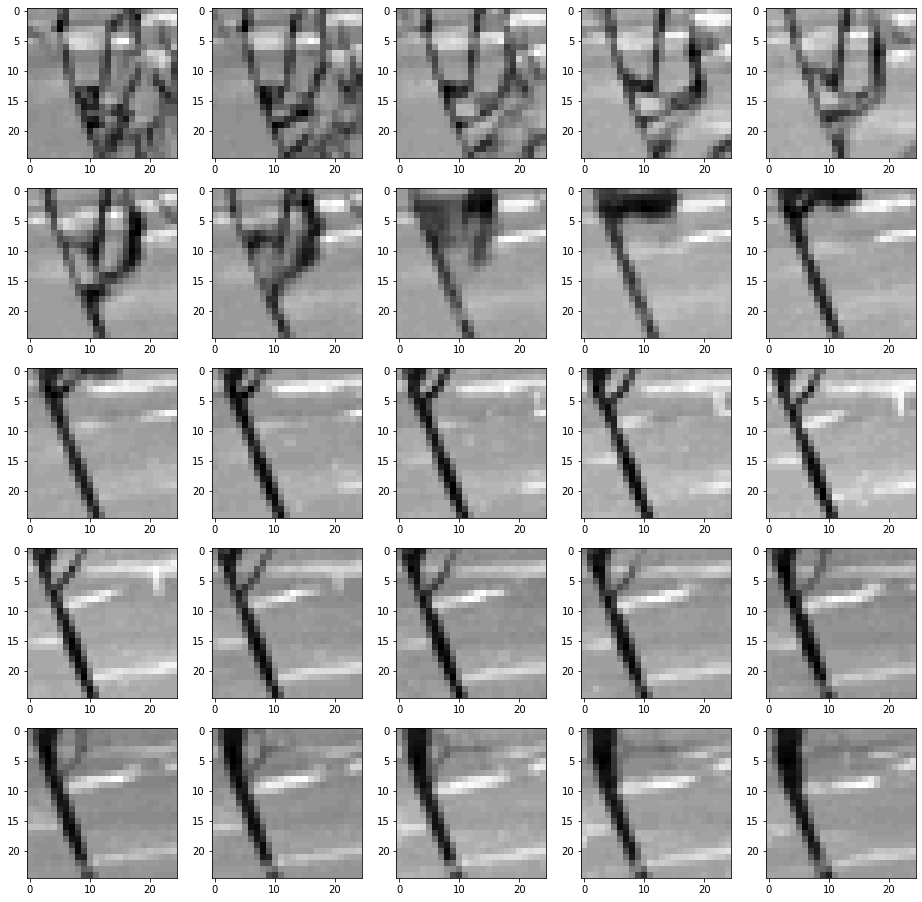

In [68]:
plt.figure(figsize=(16, 16))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(mat[:, :, i], "gray")

Now we need to convert the data into a form which is easy to understand for holoviews. First, we create x, y, and z coordinates.

In [69]:
nx, ny, nz = mat.shape
x, y, z = np.meshgrid(np.arange(nx), np.arange(ny), np.arange(nz))

Then convert the 3D data into a 1D array using `.flatten` and put it in a dictionary.

In [70]:
data = {"x": x.flatten(), "y": y.flatten(), "z": z.flatten(), "value": mat.flatten()}

Now we can create a holoviews Dataset.

In [71]:
rock = hv.Dataset(data, kdims=["x", "y", "z"], vdims=["value"])

Data has three dimensions. We can easily visualise two using a heatmap, and use a slider to change the third dimension.

In [72]:
rock.to(hv.HeatMap, groupby="z")

:HoloMap   [z]
   :HeatMap   [x,y]   (value)

To make it more interesting we can create three plots and each having one of the dimensions on the slider.

In [73]:
import bokeh.palettes as pal

In [74]:
%%opts HeatMap {+axiswise} [xaxis=None yaxis=None width=200 height=200]
cmap = pal.Turbo256
hmx = rock.to(hv.HeatMap, ['z', 'y'], dynamic=True).opts(cmap=cmap)
hmy = rock.to(hv.HeatMap, ['z', 'x'], dynamic=True).opts(cmap=cmap)
hmz = rock.to(hv.HeatMap, ['x', 'y'], dynamic=True).opts(cmap=cmap)

In [75]:
(hmx + hmy + hmz).redim.range(value=(mat.min(), mat.max()))

:Layout
   .DynamicMap.I   :DynamicMap   [x]
      :HeatMap   [z,y]   (value)
   .DynamicMap.II  :DynamicMap   [y]
      :HeatMap   [z,x]   (value)
   .DynamicMap.III :DynamicMap   [z]
      :HeatMap   [x,y]   (value)

We can also aggregate on of the dimensions and turn the data into 2D. In the example below `x` dimension is removed by the average `x` and replaced by an average value in that direction.

In [76]:
hv.HeatMap(rock.reduce(x=np.mean)).opts(cmap=cmap)

:HeatMap   [y,z]   (value)

## Streams
Streams allows us to modify the plots without sliders and derpdown menus. To see the capabilities of streams, let's start by creating a dynamic map of the population data. Like before, we need to create the function first. The function will return a bar plot of population densities for a given year.

In [77]:
def create_plot(year):
    new_df = df.loc[df["year"] == year]
    x = new_df["country"]
    y = new_df["pop_density"]
    return hv.Bars((x, y), kdims="Countires", vdims="Population Density").opts(
        ylim=(0, 1800), title=str(year)
    )

Now, we can create a dynamic map and use a slider to select the year.

In [78]:
%opts Bars [xrotation=60 width=500]

In [79]:
dmap = hv.DynamicMap(create_plot, kdims=["year"]).redim.range(year=(1961, 2018))
dmap

:DynamicMap   [year]
   :Bars   [Countires]   (Population Density)

We can also change the year using a `Stream` object.

In [80]:
from holoviews.streams import Stream

Year = Stream.define("Year", year=1961)

This time instead of passing in `kdims` we pass in stream object.

In [81]:
dmap = hv.DynamicMap(create_plot, streams=[Year(year=1961)])
dmap

:DynamicMap   []
   :Bars   [Countires]   (Population Density)

Notice we don't have the slider anymore. But we can change the plot using `.event` method.

In [82]:
dmap.event(year=2000)

It means now we can change the year in the code and even create an animation.

In [83]:
from time import sleep

In [84]:
dmap

:DynamicMap   []
   :Bars   [Countires]   (Population Density)

In [85]:
for year in range(1961, 2019):
    dmap.event(year=year)
    sleep(0.1)

There is an easier way to do create an animation as well. Dynamic maps have a method called `periodic` which does the exact same job. It changes a value periodically a certain number of time. To use it, we need to pass in the following arguments:
- period: How many seconds should it wait before changing the value again. Before, we did this using `sleep`.
- count: How many values are going to be used.
- param_fn: `periodic` automatically starts counting from `1` until it reaches the value of `count`. If we don't specify anything it will pass in these values. In most cases we need to define a function which maps the counter to the value we want to update in the plot.
- timeout: Number of seconds after which the process will stop, even if the counting is not finished. If we don't pass in a value, it will run until the counting is done.

In [86]:
dmap

:DynamicMap   []
   :Bars   [Countires]   (Population Density)

In [87]:
start_year = 1961
end_year = 2018

dmap.periodic(
    period=0.2,
    count=end_year - start_year + 1,
    param_fn=lambda x: {"year": start_year + x - 1},
    timeout=15,
)

## Dashboards
We learned about using `DynamicMap` to create tools which helps us explore the data. But the tools we had access to were limited to a dropdown menu and a slider. What if we need more advanced tools. There is a package called __Panel__ developed by the same team as holoviews which specialised in creating dashboards. Here we will see a few examples of panel to see how we can use holoviews and panel to create dashboards.

In [88]:
import panel as pn

We are going to use a data set containing production rate of a few wells in Buchan Oil Field.

In [89]:
import geopandas as gpd
import matplotlib.pyplot as plt

df = gpd.read_file(
    "../../data/processed/daily_buchan_prod_data/Daily_Buchan_Production_Data.gpkg"
)

In [90]:
df.head()

,DATE_,X,Y,WELLID,FIELDWELL,DAILY_WELL_DRY_OIL_BBL,PRODUCED_GAS_GAS_MMCF,PRODUCED_WATER_BBL,geometry
0,1982-09-01T00:00:00,-0.009973,57.903951,20/05a- 1,Buchan:B04,103004.15,30.15,0.00,POINT (-0.00997 57.90395)
1,1982-10-01T00:00:00,-0.009973,57.903951,20/05a- 1,Buchan:B04,98830.14,28.89,0.00,POINT (-0.00997 57.90395)
2,1983-05-01T00:00:00,-0.009973,57.903951,20/05a- 1,Buchan:B04,171713.24,50.05,126.99,POINT (-0.00997 57.90395)
3,1983-06-01T00:00:00,-0.009973,57.903951,20/05a- 1,Buchan:B04,220180.31,63.98,13648.94,POINT (-0.00997 57.90395)
4,1983-07-01T00:00:00,-0.009973,57.903951,20/05a- 1,Buchan:B04,159780.23,46.99,83178.52,POINT (-0.00997 57.90395)


In [91]:
df.tail()

,DATE_,X,Y,WELLID,FIELDWELL,DAILY_WELL_DRY_OIL_BBL,PRODUCED_GAS_GAS_MMCF,PRODUCED_WATER_BBL,geometry
31073,2007-03-09T00:00:00,0.032207,57.903599,21/01a- 9V,Buchan:B03w,1280.48,0.23,1357.40,POINT (0.03221 57.90360)
31074,2007-03-10T00:00:00,0.032207,57.903599,21/01a- 9V,Buchan:B03w,1244.36,0.22,1394.24,POINT (0.03221 57.90360)
31075,2007-03-11T00:00:00,0.032207,57.903599,21/01a- 9V,Buchan:B03w,1289.53,0.23,1253.52,POINT (0.03221 57.90360)
31076,2007-03-12T00:00:00,0.032207,57.903599,21/01a- 9V,Buchan:B03w,1254.35,0.23,1290.04,POINT (0.03221 57.90360)
31077,2007-03-13T00:00:00,0.032207,57.903599,21/01a- 9V,Buchan:B03w,1294.16,0.23,1064.91,POINT (0.03221 57.90360)


In [92]:
df["DATE_"] = pd.to_datetime(df["DATE_"])
df.sort_values(by=["WELLID", "DATE_"], inplace=True)
df.index = df["DATE_"]

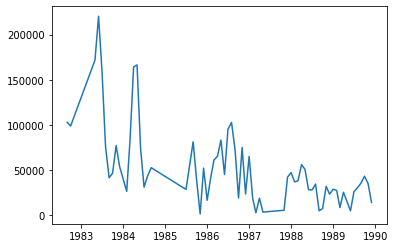

In [93]:
wells = df["WELLID"].unique()
x = df.loc[df["WELLID"] == wells[0], "DATE_"]
y = df.loc[df["WELLID"] == wells[0], "DAILY_WELL_DRY_OIL_BBL"]
plt.plot(x, y)

In [94]:
df.describe()

,X,Y,DAILY_WELL_DRY_OIL_BBL,PRODUCED_GAS_GAS_MMCF,PRODUCED_WATER_BBL
count,31078.000000,31078.000000,31078.000000,31078.000000,31078.000000
mean,0.023672,57.898739,4502.121766,1.196521,1248.955740
std,0.009867,0.005665,21947.311109,7.699451,6229.146747
min,-0.010028,57.891830,0.000000,0.010000,0.000000
25%,0.011993,57.892625,655.750000,0.130000,211.155000
50%,0.032083,57.903596,1116.495000,0.220000,564.550000
75%,0.032142,57.903599,1897.120000,0.370000,1169.297500
max,0.032207,57.904217,578457.410000,869.790000,324214.730000


### Using `param` Classes
The first method to create a dashboard is using `param` library. Using this library we can create a class which inherits from `param.Parametrized`. In the class we need to define selectors (which will appear as dropdown menus, sliders, etc.) and then create a class method which will use the data and the selected values from the selectors and returns a plot.

In [95]:
import param


class ProductionPlot(param.Parameterized):
    well_id = param.ObjectSelector(default="20/05a- 1", objects=df["WELLID"].unique())
    product = param.ObjectSelector(default="Oil", objects=["Oil", "Gas", "Water"])

    @param.depends("well_id", "product")
    def plot(self):
        product = self.product
        well_id = self.well_id
        if product.lower() == "oil":
            col = "DAILY_WELL_DRY_OIL_BBL"
            ylim = (0, 600000)
        elif product.lower() == "gas":
            col = "PRODUCED_GAS_GAS_MMCF"
            ylim = (0, 1000)
        else:
            col = "PRODUCED_WATER_BBL"
            ylim = (0, 400000)

        x = df.loc[df["WELLID"] == well_id, "DATE_"]
        y = df.loc[df["WELLID"] == well_id, col]
        prod_plot = hv.Curve((x, y), kdims=["Date"], vdims=["Production"]).opts(
            ylim=ylim
        )
        return prod_plot

Then we create an instance of the class, and convert the method into a `DynamicMap`.

In [96]:
%opts Curve {+framewise}

prod_plot = ProductionPlot()
dmap = hv.DynamicMap(prod_plot.plot)


Then we use `panel` to create a widget.

In [97]:
widget = pn.panel(prod_plot.param, parameters=["well_id", "product"])

Finally, we can use `panel.Row` to put together the pieces (widget and dynamic map) in a row.

In [98]:
pn.Row(widget, dmap)

Row
    [0] Column(margin=5, name='Param55897', width=300)
        [0] StaticText(value='<b>ProductionPlot</b>')
        [1] Select(name='Well id', options=OrderedDict([('20/05a- 1',...]), value='20/05a- 1')
        [2] Select(name='Product', options=OrderedDict([('Oil', ...]), value='Oil')
    [1] HoloViews(DynamicMap)

### Using functions
There is also another way of achieving the same result. We can use panel's widgets and decorator to attach the widget directly to a function.

First, we need to create widget elements using which we will choose the value.

In [99]:
well_id = pn.widgets.Select(options=df["WELLID"].unique().tolist())
product = pn.widgets.RadioButtonGroup(options=["Oil", "Gas", "Water"])

Then we will define a callback function which will generate the plot. To attach this function to the widgets we use a decorator.

<div class='alert alert-warning' style='font-size=120%'>
    Decorators are functions which take another function as an input and then modify it and return a new function. To learn more about decorators, what they are and why you would use them check out this <a href='https://www.datacamp.com/community/tutorials/decorators-python'>page</a>.
</div>

In the decorator we need to apecify how the inputs of the function are connected to the widgets.

In [100]:
@pn.depends(well_id=well_id.param.value, product=product.param.value)
def production_callback(well_id, product):
    if product.lower() == "oil":
        col = "DAILY_WELL_DRY_OIL_BBL"
    elif product.lower() == "gas":
        col = "PRODUCED_GAS_GAS_MMCF"
    else:
        col = "PRODUCED_WATER_BBL"

    x = df.loc[df["WELLID"] == well_id, "DATE_"]
    y = df.loc[df["WELLID"] == well_id, col]
    prod_plot = hv.Curve((x, y), kdims=["Date"], vdims=["Production"])
    return prod_plot

Then, we create a dynamic map using the callback function.

In [101]:
dmap = hv.DynamicMap(production_callback)

We also need to create a widget box which contains all the widgets.

In [102]:
widget_box = pn.WidgetBox("#### Production Explorer", product, well_id)
widget_box.width = 200
widget_box.height = 150

And now we are ready to see the result

In [103]:
pn.Row(widget_box, dmap)

Row
    [0] WidgetBox(css_classes=['widget-box'], height=150, width=200)
        [0] Markdown(str)
        [1] RadioButtonGroup(options=['Oil', 'Gas', 'Water'], value='Oil')
        [2] Select(options=['20/05a- 1', ...], value='20/05a- 1')
    [1] HoloViews(DynamicMap)

This was a simple example, but using the same techniques we can generate more complex plots and widgets as well.

Let's add a second plot which shows the location of the wells as well.

In [104]:
@pn.depends(well_id=well_id.param.value)
def wells_callback(well_id):
    # shows the location of all wells
    locations = hv.Scatter(df[["X", "Y", "WELLID"]].groupby("WELLID").mean()).opts(
        xlim=(-0.02, 0.04), ylim=(57.89, 57.906), size=10, marker="x", color="k"
    )

    # shows the location of selected well
    target_location = hv.Scatter(
        df.loc[df["WELLID"] == well_id, ["X", "Y", "WELLID"]].groupby("WELLID").mean()
    ).opts(size=10, color="r")

    return locations * target_location


dmap2 = hv.DynamicMap(wells_callback)

In [105]:
%opts Scatter [height=350 width=350]
widget_box = pn.WidgetBox('#### Production Explorer', product,well_id)


pn.Column(widget_box,pn.Row(dmap2,dmap))

Column
    [0] WidgetBox(css_classes=['widget-box'])
        [0] Markdown(str)
        [1] RadioButtonGroup(options=['Oil', 'Gas', 'Water'], value='Oil')
        [2] Select(options=['20/05a- 1', ...], value='20/05a- 1')
    [1] Row
        [0] HoloViews(DynamicMap)
        [1] HoloViews(DynamicMap)

__The example below plots the production rate of products against each other for each year.__

In [110]:
product1 = pn.widgets.RadioButtonGroup(options=["Oil", "Gas", "Water"], value="Oil")
product2 = pn.widgets.RadioButtonGroup(options=["Oil", "Gas", "Water"], value="Gas")
year = pn.widgets.Player(start=1982, end=2010, value=1990, loop_policy="loop")

# We can also use a slider to select the year
# year = pn.widgets.IntSlider(start=1982, end=2010, value=1990)


def get_column_name(product):
    if product.lower() == "oil":
        col = "DAILY_WELL_DRY_OIL_BBL"
    elif product.lower() == "gas":
        col = "PRODUCED_GAS_GAS_MMCF"
    else:
        col = "PRODUCED_WATER_BBL"
    return col


@pn.depends(
    product1=product1.param.value, product2=product2.param.value, year=year.param.value
)
def production_callback2(product1, product2, year):
    col1 = get_column_name(product1)
    col2 = get_column_name(product2)
    df_year = df[str(year)]
    plots = hv.Scatter([])
    fields = df["FIELDWELL"].unique()
    cmap = palettes.Category20[len(fields)]
    for i, fld in enumerate(fields):
        plots *= hv.Scatter(
            df_year.loc[df_year["FIELDWELL"] == fld], kdims=[col1], vdims=[col2]
        ).opts(
            xlabel=product1.upper(),
            ylabel=product2.upper(),
            title=f"Year: {year}",
            logx=True,
            logy=True,
            color=cmap[i],
            size=5,
            alpha=0.5,
            bgcolor="black",
            tools=["hover"],
        )

    return plots

In [111]:
dmap = hv.DynamicMap(production_callback2)

In [112]:
widget_box = pn.WidgetBox(
    "#### Production Explorer",
    pn.WidgetBox("__X Axis__", product1, align="center"),
    pn.WidgetBox("__Y Axis__", product2, align="center"),
    year,
    align="center",
)
# Uncomment the line below if you want to manually change the size of widget-box
# widget_box.width = 300
# widget_box.height = 300

In [113]:
%opts Scatter [width=500 height=500]
pn.Column(widget_box,dmap)

Column
    [0] WidgetBox(align='center', css_classes=['widget-box'])
        [0] Markdown(str)
        [1] WidgetBox(align='center', css_classes=['widget-box'])
            [0] Markdown(str)
            [1] RadioButtonGroup(options=['Oil', 'Gas', 'Water'], value='Oil')
        [2] WidgetBox(align='center', css_classes=['widget-box'])
            [0] Markdown(str)
            [1] RadioButtonGroup(options=['Oil', 'Gas', 'Water'], value='Gas')
        [3] Player(end=2010, loop_policy='loop', start=1982, value=1990)
    [1] HoloViews(DynamicMap)

<div class='alert alert-warning'>If the plot looks empty, try zooming out. As the values change sometimes the move outside of the initial range.</div>

`Panel` has a long list of different widgets you can use in your dashboard. You can find the full list [here](https://panel.holoviz.org/user_guide/Widgets.html).

# Further Reading
- [HoloViews getting started](https://holoviews.org/getting_started/Introduction.html)
- [Holoviews Examples](http://holoviews.org/Examples/index.html)
- [Panel Dashboard Examples](https://panel.holoviz.org/gallery/index.html)
- https://www.kaggle.com/ukveteran/holoviews-masterclass-jma
- https://github.com/ioam/jupytercon2017-holoviews-tutorial
- https://www.youtube.com/watch?v=cMXKE0nB8k4
